# 数据的合并，来进行数据的预测

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from tabulate import tabulate 
plt.rcParams["font.sans-serif"] = ["SimHei"]  # 用来显示中文
plt.rcParams["axes.unicode_minus"] = False  # 用来显示负号
#忽略警告
import warnings
warnings.filterwarnings('ignore')

In [37]:
# 查看数据
data_count=pd.read_csv('./食品销售数据集-销售明细表.csv')

data_store=pd.read_csv('./食品销售数据集-门店表.csv')

data_user=pd.read_csv('./食品销售数据集-会员表.csv')

data_objct=pd.read_csv('./食品销售数据集-产品表.csv')

plt.rcParams["font.sans-serif"] = ["SimHei"]  # 用来显示中文
plt.rcParams["axes.unicode_minus"] = False  # 用来显示负号

# 合并时为重复的列名添加后缀
merged_data_new = pd.merge(data_count, data_store, how='inner', left_on='store_id', right_on='id', suffixes=('_merged_data_new', '_data_store'))
merged_data_new2 = pd.merge(merged_data_new, data_user, how='inner', left_on='user_id', right_on='id', suffixes=('_merged_data_new2', '_data_user'))
merged_data_list = pd.merge(merged_data_new2, data_objct, how='inner', left_on='pro_id', right_on='id', suffixes=('_merged_data_list', '_data_objct'))
# 选择性地保留其中一个相同的列，例如，保留来自 merged_data_new2 的列
merged_data_new3 = merged_data_list[['date','user_id','area','province','city','category','sub_category','brand','gender','age','amount','quantity']]

# 格式化处理日期
merged_data_new3['date'] = pd.to_datetime(merged_data_new3['date'], format='%d/%m/%Y %H:%M:%S').dt.date

# 输出处理后的 DataFrame
print(merged_data_new3)

               date    user_id area province  city  category sub_category  \
0        2019-04-05  cus_00001   西南      四川省   达州市       益生菌        综合益生菌   
1        2019-08-10  cus_00002   华南      海南省   三亚市   米粉_面条_粥           面条   
2        2019-06-07  cus_00003   华东      江苏省  连云港市  溶豆_泡芙_米饼           溶豆   
3        2019-12-12  cus_00004   东北     黑龙江省  哈尔滨市       益生菌        综合益生菌   
4        2019-09-22  cus_00005   华东      山东省   济南市   米粉_面条_粥           米粉   
...             ...        ...  ...      ...   ...       ...          ...   
1003867  2021-03-08  cus_97156   西南      四川省   南充市       益生菌        综合益生菌   
1003868  2021-01-14  cus_53874   华东      山东省   淄博市      休闲零食           糖果   
1003869  2021-02-09  cus_93979   西南      贵州省   黔南州        饼干           饼干   
1003870  2021-03-25  cus_93075   东北      吉林省   长春市      休闲零食           糖果   
1003871  2021-05-19  cus_95147   华北      河北省   承德市        泥类           果泥   

          brand gender  age   amount  quantity  
0           合生元      女   3

In [38]:
import pandas as pd

# 读取数据
sales_data = merged_data_new3

# 将日期转换为时间序列格式
sales_data['date'] = pd.to_datetime(sales_data['date'])

# 筛选出不包含 2021 年的数据
sales_data = sales_data[sales_data['date'].dt.year != 2021]

# 将销售额按照area和province进行汇总
sales_by_area_province = sales_data.groupby(['area', 'province', pd.Grouper(key='date', freq='M')]).sum()['amount']

# 将 Series 转换为 DataFrame
sales_by_area_province = sales_by_area_province.reset_index()

# 将最后一列命名为 "amount"
sales_by_area_province.columns = ['area', 'province', 'date', 'amount']

# 查看处理后的数据
print(sales_by_area_province.head(30))

   area province       date     amount
0    东北      吉林省 2019-01-31   49146.73
1    东北      吉林省 2019-02-28   40616.52
2    东北      吉林省 2019-03-31   92353.58
3    东北      吉林省 2019-04-30   77967.07
4    东北      吉林省 2019-05-31   93456.48
5    东北      吉林省 2019-06-30  100222.31
6    东北      吉林省 2019-07-31   85242.30
7    东北      吉林省 2019-08-31  109272.92
8    东北      吉林省 2019-09-30  102265.05
9    东北      吉林省 2019-10-31  121881.01
10   东北      吉林省 2019-11-30  109984.15
11   东北      吉林省 2019-12-31  105902.76
12   东北      吉林省 2020-01-31   95740.36
13   东北      吉林省 2020-02-29   57418.98
14   东北      吉林省 2020-03-31   84555.94
15   东北      吉林省 2020-04-30   90597.24
16   东北      吉林省 2020-05-31   98864.17
17   东北      吉林省 2020-06-30   99741.18
18   东北      吉林省 2020-07-31   79308.98
19   东北      吉林省 2020-08-31  101704.14
20   东北      吉林省 2020-09-30   94243.57
21   东北      吉林省 2020-10-31   82310.89
22   东北      吉林省 2020-11-30   89766.33
23   东北      吉林省 2020-12-31   71608.95
24   东北      辽宁省 2019-01-

# 计算滚动平均

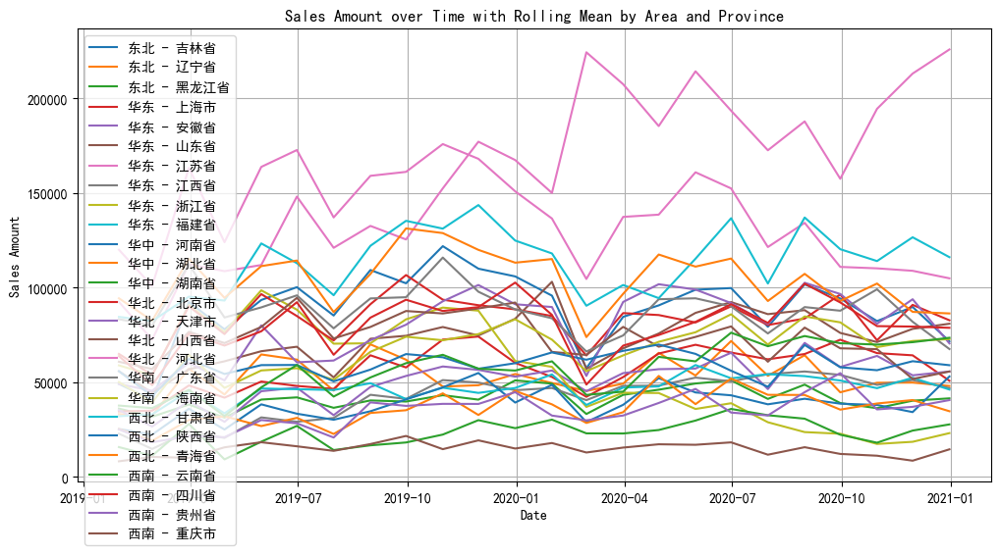

In [40]:

sales_data['rolling_mean'] = sales_by_area_province.groupby(['area', 'province'])['amount'].rolling(window=3, min_periods=1).mean().reset_index(level=[0, 1], drop=True)

# 绘制销售额随时间的趋势图和滚动平均
plt.figure(figsize=(12, 6))
for (area, province), group in sales_data.groupby(['area', 'province']):
    plt.plot(group.index, group['amount'], label=f'{area} - {province}')
    # plt.plot(group.index, group['rolling_mean'], linestyle='--', label=f'Rolling Mean ({area} - {province})')

plt.title('Sales Amount over Time with Rolling Mean by Area and Province')
plt.xlabel('Date')
plt.ylabel('Sales Amount')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


# 计算销售额的滚动均值

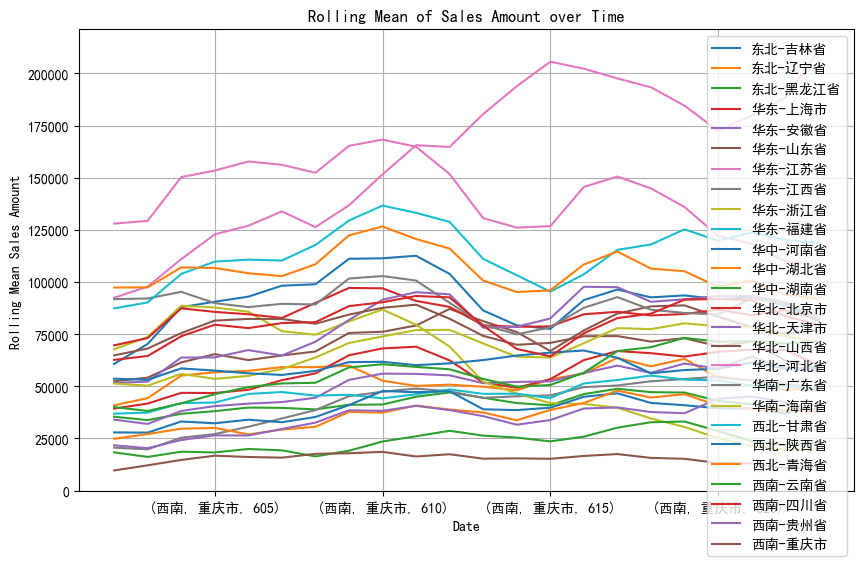

In [41]:


rolling_mean = sales_by_area_province.groupby(['area', 'province'])['amount'].rolling(window=3).mean()

# 绘制滚动均值图
plt.figure(figsize=(10, 6))
for (area, province), group in rolling_mean.groupby(['area', 'province']):
    group.plot(label=f'{area}-{province}')

plt.title('Rolling Mean of Sales Amount over Time')
plt.xlabel('Date')
plt.ylabel('Rolling Mean Sales Amount')
plt.legend()
plt.grid(True)
plt.show()

# 对销售额进行一阶差分

In [145]:

sales_by_area_province['amount_diff'] = sales_by_area_province.groupby(['area', 'province'])['amount'].diff()

# 查看处理后的数据# 计算销售额的滚动均值
print(sales_by_area_province.head(10))
print(sales_by_area_province.shape[0])  


  area province       date     amount  amount_diff
0   东北      吉林省 2019-01-31   49146.73          NaN
1   东北      吉林省 2019-02-28   40616.52     -8530.21
2   东北      吉林省 2019-03-31   92353.58     51737.06
3   东北      吉林省 2019-04-30   77967.07    -14386.51
4   东北      吉林省 2019-05-31   93456.48     15489.41
5   东北      吉林省 2019-06-30  100222.31      6765.83
6   东北      吉林省 2019-07-31   85242.30    -14980.01
7   东北      吉林省 2019-08-31  109272.92     24030.62
8   东北      吉林省 2019-09-30  102265.05     -7007.87
9   东北      吉林省 2019-10-31  121881.01     19615.96
624


In [140]:
# 或者使用均值来填充缺失值
sales_by_area_province['amount_diff'] = sales_by_area_province['amount_diff'].fillna(sales_by_area_province['amount_diff'].mean())
print(sales_by_area_province.head(20))
print(sales_by_area_province.shape[0]) 


   area province       date     amount   amount_diff
0    东北      吉林省 2019-01-31   49146.73    692.928562
1    东北      吉林省 2019-02-28   40616.52  -8530.210000
2    东北      吉林省 2019-03-31   92353.58  51737.060000
3    东北      吉林省 2019-04-30   77967.07 -14386.510000
4    东北      吉林省 2019-05-31   93456.48  15489.410000
5    东北      吉林省 2019-06-30  100222.31   6765.830000
6    东北      吉林省 2019-07-31   85242.30 -14980.010000
7    东北      吉林省 2019-08-31  109272.92  24030.620000
8    东北      吉林省 2019-09-30  102265.05  -7007.870000
9    东北      吉林省 2019-10-31  121881.01  19615.960000
10   东北      吉林省 2019-11-30  109984.15 -11896.860000
11   东北      吉林省 2019-12-31  105902.76  -4081.390000
12   东北      吉林省 2020-01-31   95740.36 -10162.400000
13   东北      吉林省 2020-02-29   57418.98 -38321.380000
14   东北      吉林省 2020-03-31   84555.94  27136.960000
15   东北      吉林省 2020-04-30   90597.24   6041.300000
16   东北      吉林省 2020-05-31   98864.17   8266.930000
17   东北      吉林省 2020-06-30   99741.18    877.

In [78]:
# 计算一阶差分
# 对销售额进行一阶差分
sales_data_diff = sales_by_area_province['amount'].diff().dropna()
# 计算二阶差分
sales_data_diff_2 = sales_data_diff.diff().dropna()

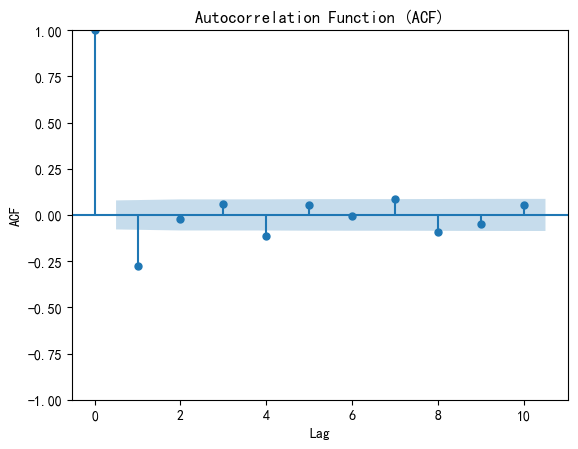

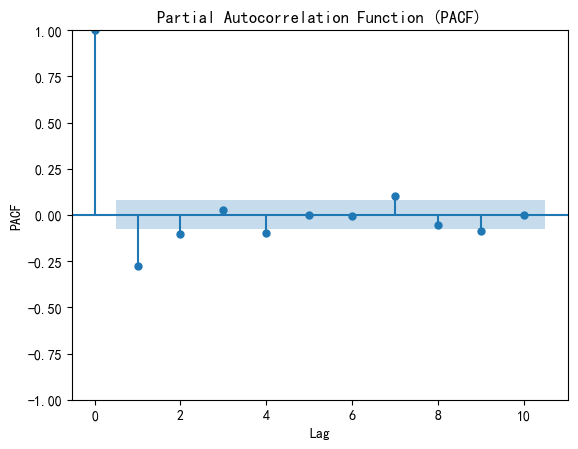

In [79]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# 绘制自相关函数（ACF）图形
plot_acf(sales_data_diff, lags=10)
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Lag')
plt.ylabel('ACF')
plt.show()

# 绘制偏自相关函数（PACF）图形
plot_pacf(sales_data_diff, lags=10)
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lag')
plt.ylabel('PACF')
plt.show()


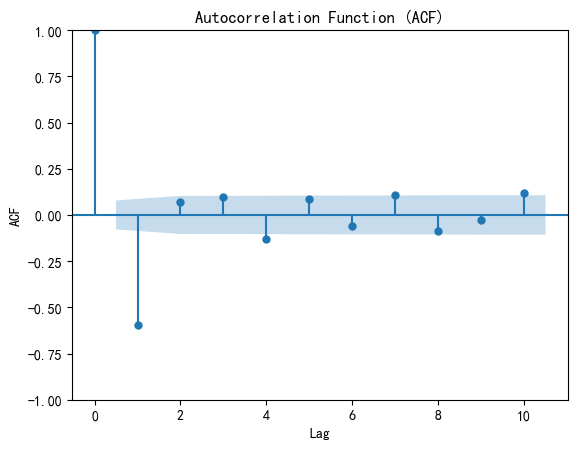

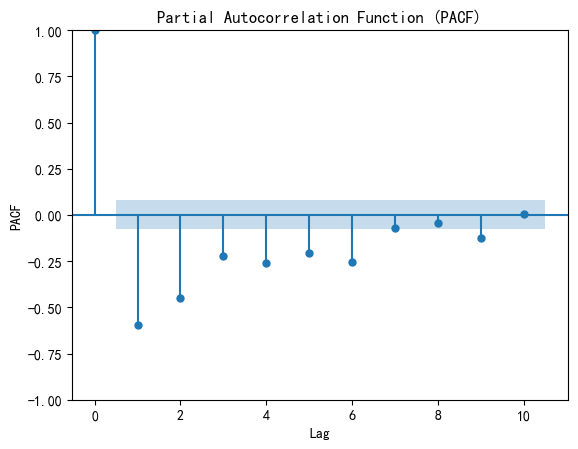

In [80]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# 绘制自相关函数（ACF）图形
plot_acf(sales_data_diff_2, lags=10)
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Lag')
plt.ylabel('ACF')
plt.show()

# 绘制偏自相关函数（PACF）图形
plot_pacf(sales_data_diff_2, lags=10)
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lag')
plt.ylabel('PACF')
plt.show()


In [81]:
# from statsmodels.tsa.arima.model import ARIMA

# # 使用确定的参数 (p=0, d=2, q=1) 拟合 ARIMA 模型
# p, d, q = 0, 2, 1
# model = ARIMA(sales_data_diff, order=(p, d, q))
# model_fit = model.fit()

# # 打印模型摘要
# print(model_fit.summary())


                               SARIMAX Results                                
Dep. Variable:                 amount   No. Observations:                  622
Model:                 ARIMA(0, 2, 1)   Log Likelihood               -7555.845
Date:                Wed, 17 Apr 2024   AIC                          15115.690
Time:                        09:22:46   BIC                          15124.549
Sample:                             0   HQIC                         15119.134
                                - 622                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9982      0.047    -21.384      0.000      -1.090      -0.907
sigma2      2.972e+09   1.51e-11   1.97e+20      0.000    2.97e+09    2.97e+09
Ljung-Box (L1) (Q):                 308.42   Jarque-

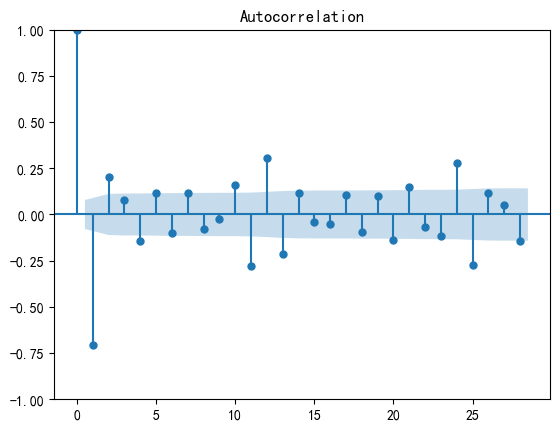

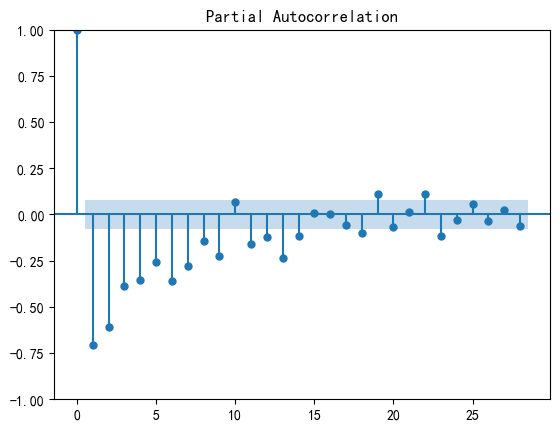

In [139]:
from statsmodels.tsa.arima.model import ARIMA

# 拟合 ARIMA 模型
model = ARIMA(sales_data_diff_2, order=(0, 2, 1))
model_fit = model.fit()

# 打印模型摘要
print(model_fit.summary())

# 绘制残差的 ACF 和 PACF 图
residuals = model_fit.resid
plot_acf(residuals)
plot_pacf(residuals)

# 进行预测
forecast = model_fit.forecast(steps=10)  # 预测未来 10 个时间点的销售额
print(forecast)


In [92]:
# 从模型中获取残差序列
residuals = model_fit.resid

# 计算Durbin-Watson统计量
from statsmodels.stats.stattools import durbin_watson
durbin_watson_statistic = durbin_watson(residuals)

print("Durbin-Watson统计量：", durbin_watson_statistic)


# Durbin-Watson统计量为3.415，接近于4，这表明残差序列之间的自相关性较小。这是一个好的迹象，表明我们的模型在捕捉数据中的自相关性方面做得相当好。

Durbin-Watson统计量： 3.4145826268925177


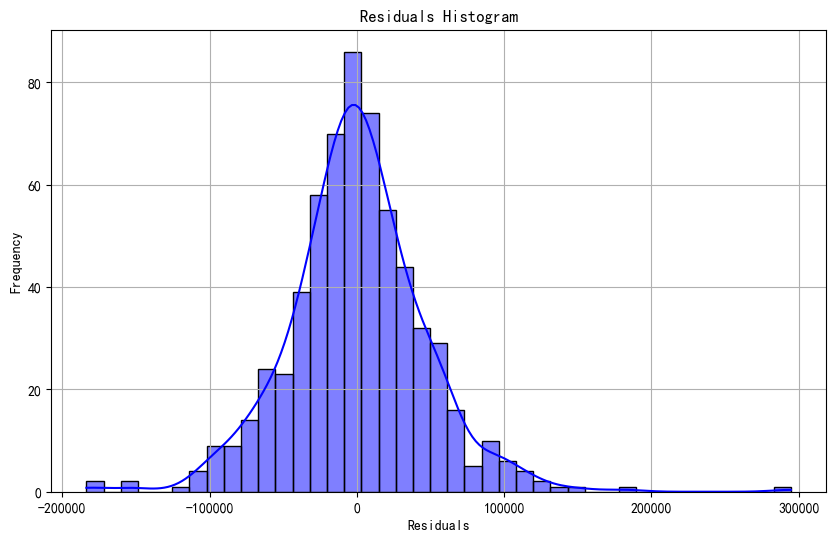

<Figure size 1000x600 with 0 Axes>

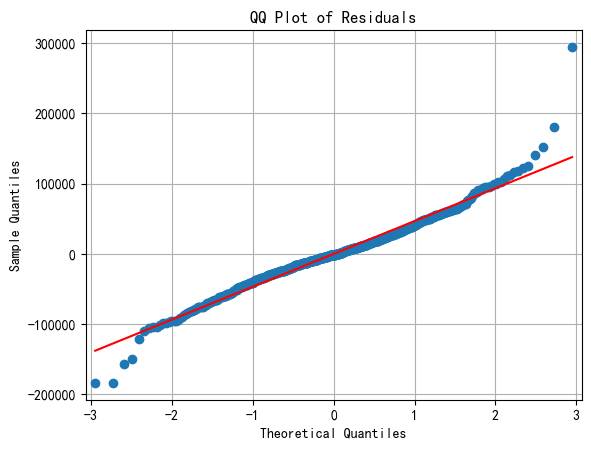

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.gofplots import qqplot

# 计算残差
residuals = model_fit.resid

# 绘制残差直方图
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='blue')
plt.title('Residuals Histogram')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 绘制QQ图
plt.figure(figsize=(10, 6))
qqplot(residuals, line='s')
plt.title('QQ Plot of Residuals')
plt.grid(True)
plt.show()


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error

# 获取训练数据和测试数据
train_data = sales_by_area_province['amount'].iloc[:500]
test_data = sales_by_area_province['amount'].iloc[500:]

print(train_data.head())
print(test_data.head(200))

# 使用 ARIMA 模型拟合训练数据
model = ARIMA(train_data, order=(0, 2, 1))
fit_model = model.fit()

# 进行预测
forecast = fit_model.forecast(steps=len(test_data))

# 比较预测值和实际观测值
plt.figure(figsize=(10, 6))
plt.plot(test_data.index, test_data.values, label='Actual', color='blue')
plt.plot(test_data.index, forecast, label='Forecast', color='red')
plt.title('Comparison of Actual and Forecasted Sales')
plt.xlabel('Date')
plt.ylabel('Sales Amount')
plt.legend()
plt.grid(True)
plt.show()

# 计算评估指标
rmse = mean_squared_error(test_data, forecast, squared=False)
mae = mean_absolute_error(test_data, forecast)
print('RMSE:', rmse)
print('MAE:', mae)


In [138]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA

# 设置未来时间步数
future_steps = 10  # 假设你想预测未来10个时间步

# 使用拟合后的模型进行未来值的预测
forecast = fit_model.forecast(steps=future_steps)

# 打印预测结果
print("未来{}个时间步的预测值：".format(future_steps))
print(forecast)


未来10个时间步的预测值：
622    8632.917130
623    8651.864260
624    8670.811391
625    8689.758521
626    8708.705651
627    8727.652781
628    8746.599912
629    8765.547042
630    8784.494172
631    8803.441302
Name: predicted_mean, dtype: float64


# 特征分析

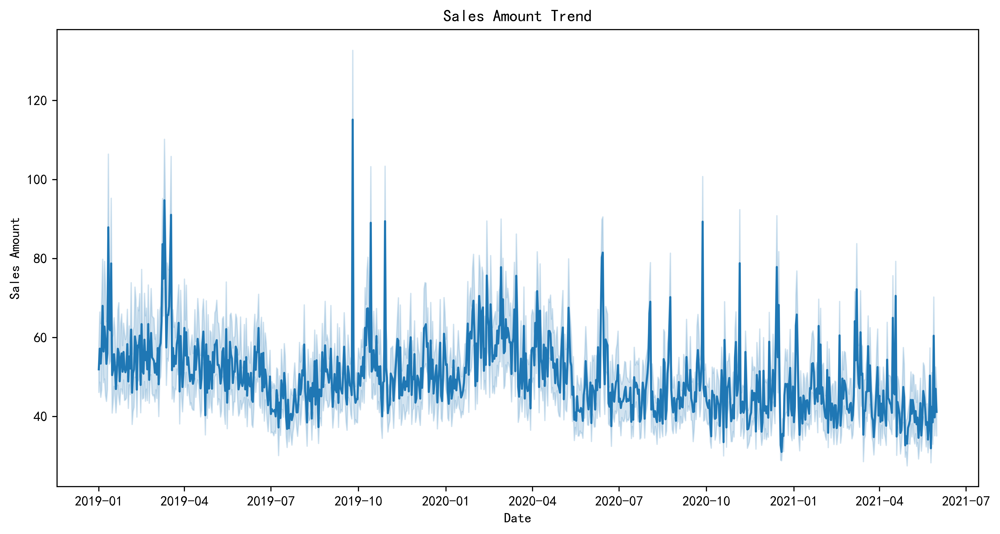

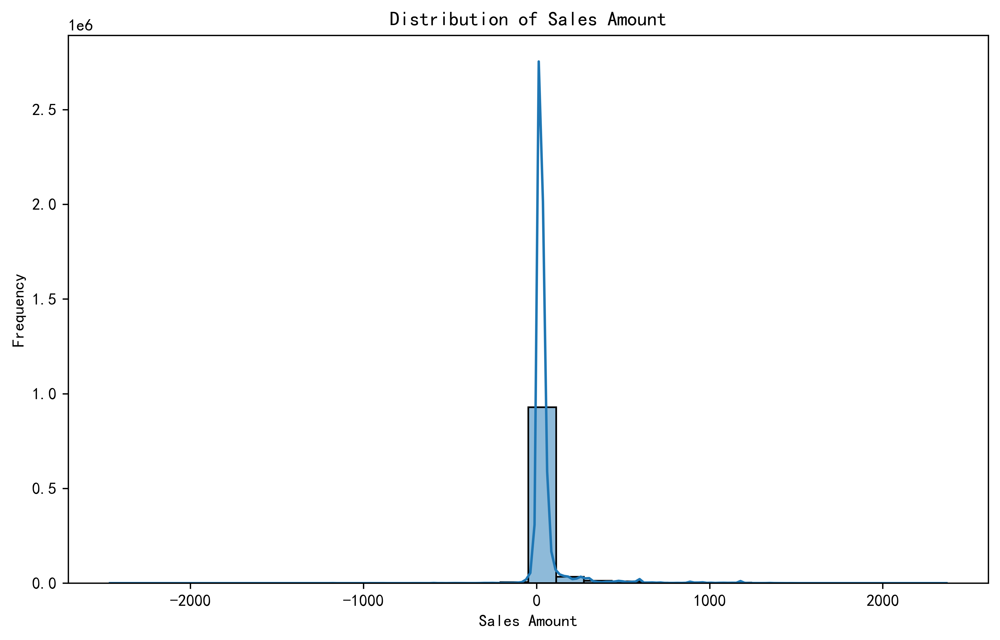

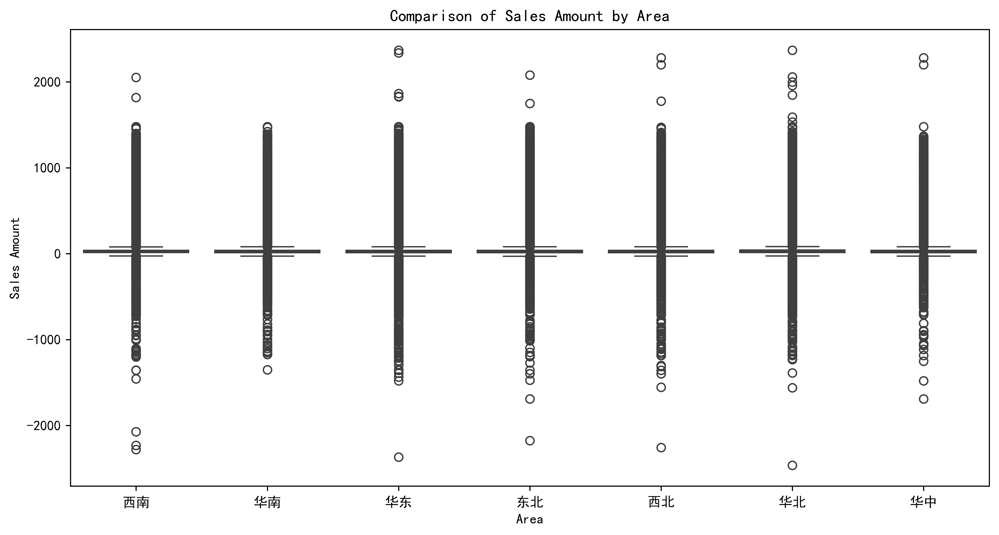

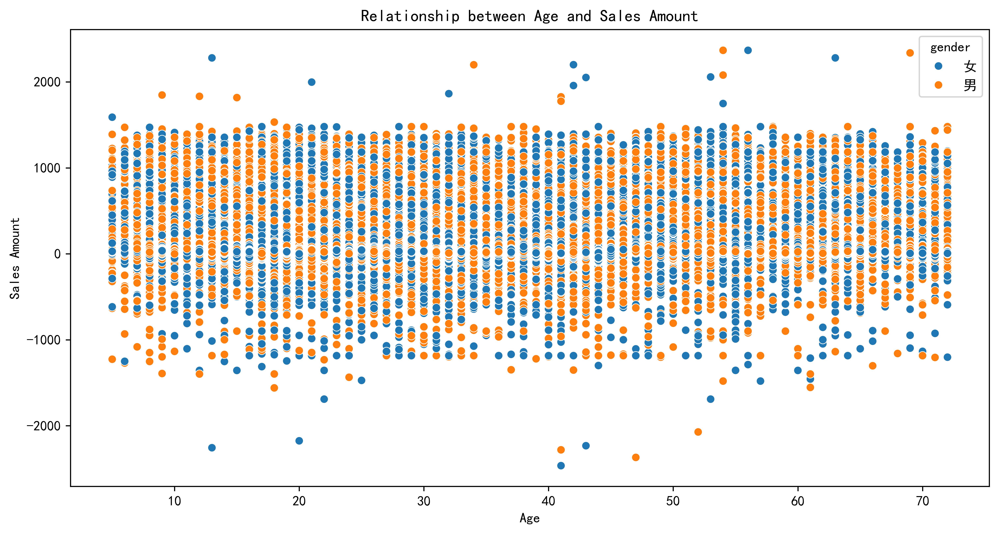

<Figure size 7200x3600 with 0 Axes>

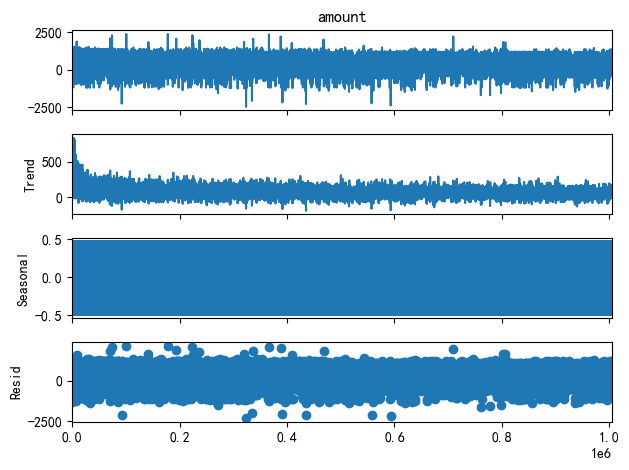

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# 销售额趋势分析
plt.figure(figsize=(12, 6),dpi = 600)
sns.lineplot(x='date', y='amount', data=merged_data_new3)
plt.title('Sales Amount Trend')
plt.xlabel('Date')
plt.ylabel('Sales Amount')
plt.show()

# 销售额分布分析
plt.figure(figsize=(10, 6),dpi = 600)
sns.histplot(merged_data_new3['amount'], bins=30, kde=True)
plt.title('Distribution of Sales Amount')
plt.xlabel('Sales Amount')
plt.ylabel('Frequency')
plt.show()

# 不同地区的销售额比较
plt.figure(figsize=(12, 6),dpi = 600)
sns.boxplot(x='area', y='amount', data=merged_data_new3)
plt.title('Comparison of Sales Amount by Area')
plt.xlabel('Area')
plt.ylabel('Sales Amount')
plt.show()

# 销售额和其他变量的关系分析（示例）
plt.figure(figsize=(12, 6),dpi = 600)
sns.scatterplot(x='age', y='amount', data=merged_data_new3, hue='gender')
plt.title('Relationship between Age and Sales Amount')
plt.xlabel('Age')
plt.ylabel('Sales Amount')
plt.show()

# 季节性分析（示例）
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(merged_data_new3['amount'], model='additive', period=12)  # 假设季节周期为12个月
plt.figure(figsize=(12, 6),dpi = 600)
decomposition.plot()
plt.show()


In [18]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

# 读取数据
sales_data = merged_data_new3

# 数据预处理
sales_data = sales_data.dropna()
sales_data = sales_data.drop_duplicates()
sales_data = sales_data[sales_data['amount'] >= 0]

# 将分类变量转换为哑变量（独热编码）
sales_data = pd.get_dummies(sales_data, columns=['area', 'province', 'category', 'sub_category', 'brand', 'gender'])

# 划分训练集和测试集
train_data = sales_data[(sales_data['date'].dt.year == 2019) | (sales_data['date'].dt.year == 2020)]
test_data = sales_data[sales_data['date'].dt.year == 2021]

# 划分特征和目标变量
X_train = train_data.drop(['date', 'user_id', 'city', 'amount'], axis=1)
y_train = train_data['amount']
X_test = test_data.drop(['date', 'user_id', 'city', 'amount'], axis=1)
y_test = test_data['amount']

# 数据标准化
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 构建神经网络模型
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1)
])

# 编译模型
model.compile(optimizer='adam', loss='mean_squared_error')

# 训练模型
history = model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_split=0.2)

# 在测试集上评估模型性能
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)


Epoch 1/50
18708/18708 [==============================] - 36s 2ms/step - loss: 3669.4968 - val_loss: 6937.2485
Epoch 2/50
18708/18708 [==============================] - 34s 2ms/step - loss: 2422.5383 - val_loss: 11934.0078
Epoch 3/50
18708/18708 [==============================] - 35s 2ms/step - loss: 2129.3037 - val_loss: 3065.9792
Epoch 4/50
18708/18708 [==============================] - 35s 2ms/step - loss: 1879.5902 - val_loss: 5244.8745
Epoch 5/50
18708/18708 [==============================] - 34s 2ms/step - loss: 1766.4091 - val_loss: 3795.0981
Epoch 6/50
18708/18708 [==============================] - 34s 2ms/step - loss: 1713.1527 - val_loss: 1275.2638
Epoch 7/50
18708/18708 [==============================] - 34s 2ms/step - loss: 1836.1711 - val_loss: 1656.1566
Epoch 8/50
18708/18708 [==============================] - 35s 2ms/step - loss: 1806.8827 - val_loss: 7279.8335
Epoch 9/50
18708/18708 [==============================] - 34s 2ms/step - loss: 1685.8634 - val_loss: 6182.7197


# 找到每个地区中消费金额最高的产品类别和品牌

In [144]:
# 读取数据
data = merged_data_new3

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按年份、地区、类别、品牌进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'area', 'category', 'brand'])['amount'].sum().reset_index()


max_amount_indices = grouped_data.groupby(['year', 'area'])['amount'].idxmax()
most_expensive_products = grouped_data.loc[max_amount_indices, ['year', 'area', 'category', 'brand']]

# 输出结果
print(most_expensive_products)


      year area category brand
98    2019   东北      益生菌   合生元
326   2019   华东      益生菌   合生元
551   2019   华中      益生菌   合生元
763   2019   华北      益生菌   合生元
981   2019   华南      益生菌   合生元
1190  2019   西北      益生菌   合生元
1405  2019   西南      益生菌   合生元
1615  2020   东北      益生菌   合生元
1843  2020   华东      益生菌   合生元
2078  2020   华中      益生菌   合生元
2303  2020   华北      益生菌   合生元
2532  2020   华南      益生菌   合生元
2756  2020   西北      益生菌   合生元
2980  2020   西南      益生菌   合生元
3191  2021   东北      益生菌   合生元
3395  2021   华东      益生菌   合生元
3603  2021   华中      益生菌   合生元
3807  2021   华北      益生菌   合生元
4019  2021   华南      益生菌   合生元
4218  2021   西北      益生菌   合生元
4423  2021   西南      益生菌   合生元


# 数据的预处理生成单独CSV文件进行初步分析

In [27]:
import pandas as pd
# 读取数据
data = merged_data_new3

# 处理重复值
data.drop_duplicates(inplace=True)

# 处理缺失值
# 如果存在缺失值，根据具体情况选择填充方法，如填充平均值、中位数等
missing_values = data.isnull().sum()
print("缺失值统计：\n", missing_values)

# 处理异常值
# 检查并处理数值型列中的异常值，如删除或者修正
data = data[(data['amount'] > 0) & (data['quantity'] > 0)]

# 数据类型转换
# 如果有需要，进行数据类型转换
data['date'] = pd.to_datetime(data['date'])

# 检查每个类别的唯一值
unique_values = {}
for column in ['category', 'sub_category', 'brand', 'gender']:
    unique_values[column] = data[column].unique()
    
# 特征编码
data_encoded = pd.get_dummies(data, columns=['category', 'sub_category', 'brand', 'gender'])

# 仅保留实际出现过的类别列
for column, unique_vals in unique_values.items():
    for val in unique_vals:
        if val not in data[column].unique():
            column_name = f"{column}_{val}"
            data_encoded.drop(column_name, axis=1, inplace=True)

# 保存预处理后的数据
data_encoded.to_csv('preprocessed_data.csv', index=False)


缺失值统计：
 date            0
user_id         0
area            0
province        0
city            0
category        0
sub_category    0
brand           0
gender          0
age             0
amount          0
quantity        0
year            0
dtype: int64


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tabulate import tabulate 

In [28]:
preprocessed_data=pd.read_csv('./preprocessed_data.csv')

In [29]:
preprocessed_data.head()

,date,user_id,area,province,city,age,amount,quantity,year,category_DHA,...,brand_采森,brand_金必氏,brand_雀巢,brand_韩美禾,brand_香贡贡,brand_麦欧欧,brand_龙牡,brand_龙牡福仔,gender_女,gender_男
0,2019-04-05,cus_00001,西南,四川省,达州市,30,576.0,2,2019,0,...,0,0,0,0,0,0,0,0,1,0
1,2020-04-04,cus_00391,西南,四川省,达州市,49,1184.0,4,2020,0,...,0,0,0,0,0,0,0,0,1,0
2,2019-03-18,cus_00880,西南,四川省,达州市,29,592.0,2,2019,0,...,0,0,0,0,0,0,0,0,1,0
3,2019-02-18,cus_01561,西南,四川省,达州市,46,592.0,2,2019,0,...,0,0,0,0,0,0,0,0,1,0
4,2019-10-25,cus_01635,西南,四川省,达州市,41,592.0,2,2019,0,...,0,0,0,0,0,0,0,0,0,1


In [30]:
import pandas as pd

# 读取清洗后的数据
data = pd.read_csv('preprocessed_data.csv')

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按照年份、地区进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'area'])['amount'].sum().reset_index()

# 比较不同地区之间的金额差异
# 计算每个地区的金额均值
average_amount_by_area = grouped_data.groupby(['year', 'area'])['amount'].mean().reset_index()

# 按照年份和金额进行排序
sorted_data = average_amount_by_area.sort_values(by=['year', 'amount'], ascending=[True, False])

# 输出结果
print(sorted_data)




    year area      amount
1   2019   华东  5546520.70
3   2019   华北  4282758.13
5   2019   西北  3289857.02
0   2019   东北  2171069.95
6   2019   西南  2071183.91
4   2019   华南  1831868.08
2   2019   华中  1026589.39
8   2020   华东  5494915.70
10  2020   华北  5081331.00
12  2020   西北  3304546.84
13  2020   西南  2366370.69
7   2020   东北  2221062.58
11  2020   华南  1885672.69
9   2020   华中  1311504.49
15  2021   华东  1798377.29
17  2021   华北  1709724.13
19  2021   西北  1117684.08
20  2021   西南   863293.80
14  2021   东北   761736.33
18  2021   华南   654977.67
16  2021   华中   478762.62


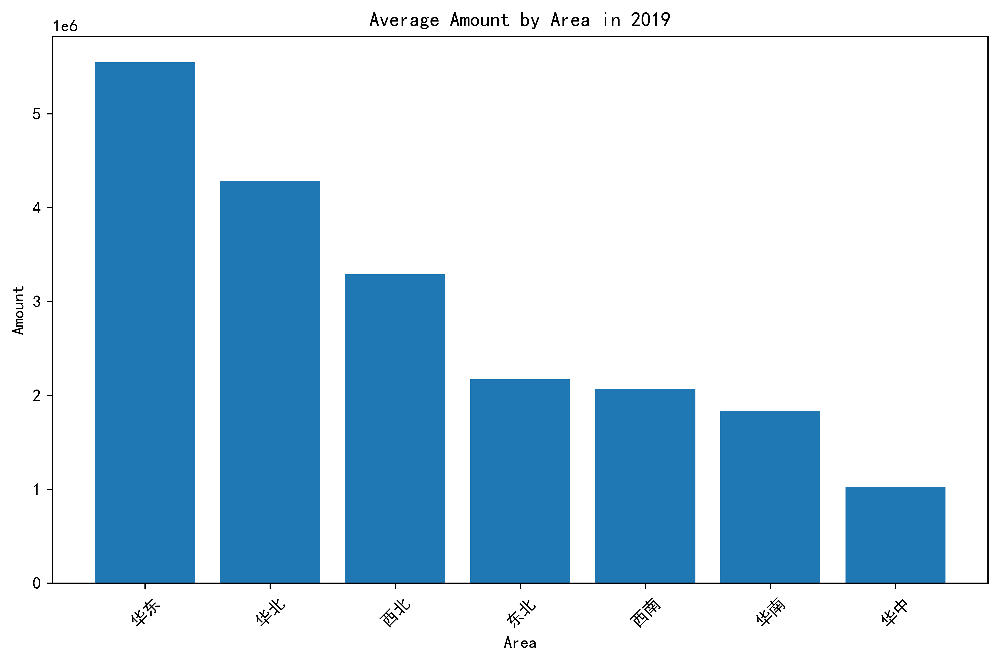

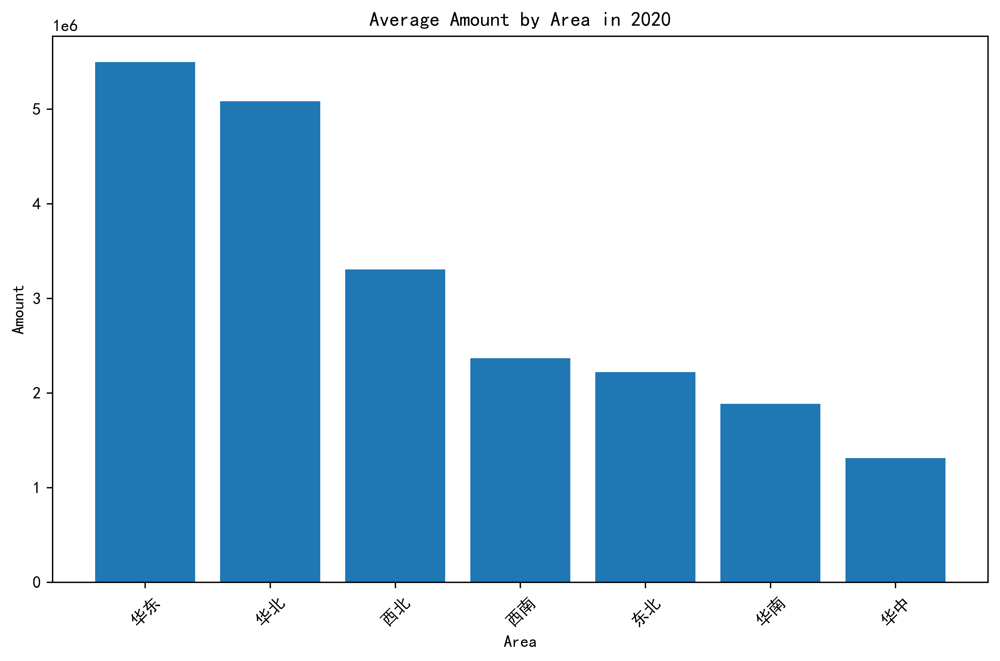

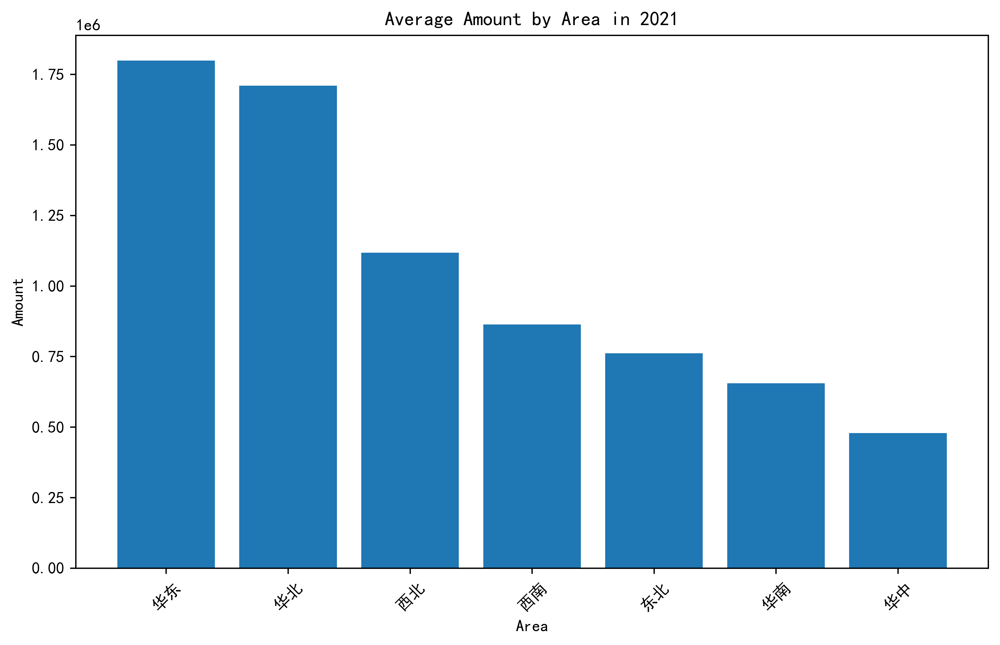

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取清洗后的数据
data = pd.read_csv('preprocessed_data.csv')

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按照年份、地区进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'area'])['amount'].sum().reset_index()

# 比较不同地区之间的金额差异
# 计算每个地区的金额均值
average_amount_by_area = grouped_data.groupby(['year', 'area'])['amount'].mean().reset_index()

# 按照年份和金额进行排序
sorted_data = average_amount_by_area.sort_values(by=['year', 'amount'], ascending=[True, False])

# 绘制条形图
years = sorted_data['year'].unique()
for year in years:
    data_year = sorted_data[sorted_data['year'] == year]
    plt.figure(figsize=(10, 6), dpi=600)  # 设置 DPI 为 600
    plt.bar(data_year['area'], data_year['amount'])
    plt.xlabel('Area')
    plt.ylabel('Amount')
    plt.title('Average Amount by Area in ' + str(year))
    plt.xticks(rotation=45)
    plt.show()


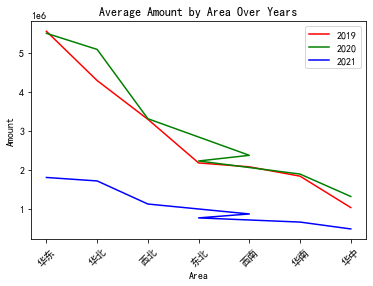

In [32]:

# 绘制折线图
colors = ['r', 'g', 'b']  # 不同年份的颜色
years = sorted_data['year'].unique()
for i, year in enumerate(years):
    data_year = sorted_data[sorted_data['year'] == year]
    plt.plot(data_year['area'], data_year['amount'], color=colors[i], label=year)

    
# 添加图例、标签等
plt.legend()
plt.xlabel('Area')
plt.ylabel('Amount')
plt.title('Average Amount by Area Over Years')
plt.xticks(rotation=45)  # 旋转x轴标签，使其更清晰可读

# 显示图表
plt.show()

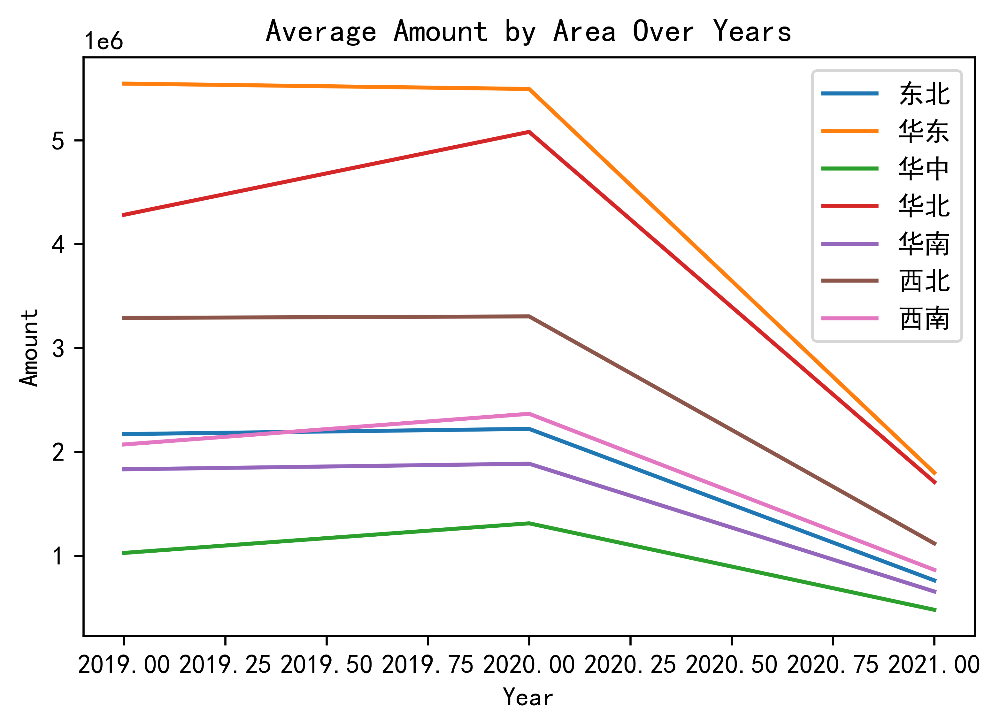

In [33]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取清洗后的数据
data = pd.read_csv('preprocessed_data.csv')

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按照年份、地区进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'area'])['amount'].sum().reset_index()

# 比较不同地区之间的金额差异
# 计算每个地区的金额均值
average_amount_by_area = grouped_data.groupby(['area', 'year'])['amount'].mean().reset_index()

plt.figure(dpi=600)

# 绘制折线图
areas = average_amount_by_area['area'].unique()
for area in areas:
    data_area = average_amount_by_area[average_amount_by_area['area'] == area]
    plt.plot(data_area['year'], data_area['amount'], label=area)

# 添加图例、标签等
plt.legend()
plt.xlabel('Year')
plt.ylabel('Amount')
plt.title('Average Amount by Area Over Years')

# 显示图表
plt.show()




In [34]:
import pandas as pd

# 读取清洗后的数据
data = pd.read_csv('preprocessed_data.csv')

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按照年份、省份进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'province'])['amount'].sum().reset_index()

# 比较不同省份之间的金额差异
# 计算每个省份的金额均值
average_amount_by_province = grouped_data.groupby(['year', 'province'])['amount'].mean().reset_index()

# 按照年份和金额进行排序
sorted_data = average_amount_by_province.sort_values(by=['year', 'amount'], ascending=[True, False])

# 输出结果
print(sorted_data)

# # 将排序后的结果覆盖到原始数据
# average_amount_by_province.sort_values(by=['year', 'province'], ascending=[True, True], inplace=True)
# print(average_amount_by_province)


    year province      amount
10  2019      江苏省  1774962.28
12  2019      河北省  1489315.30
18  2019      甘肃省  1332612.72
24  2019      青海省  1275970.59
9   2019      广东省  1099909.58
..   ...      ...         ...
77  2021     黑龙江省   172824.58
68  2021      湖北省   159613.46
69  2021      湖南省   107454.21
66  2021      浙江省    84089.49
74  2021      重庆市    41918.24

[78 rows x 3 columns]


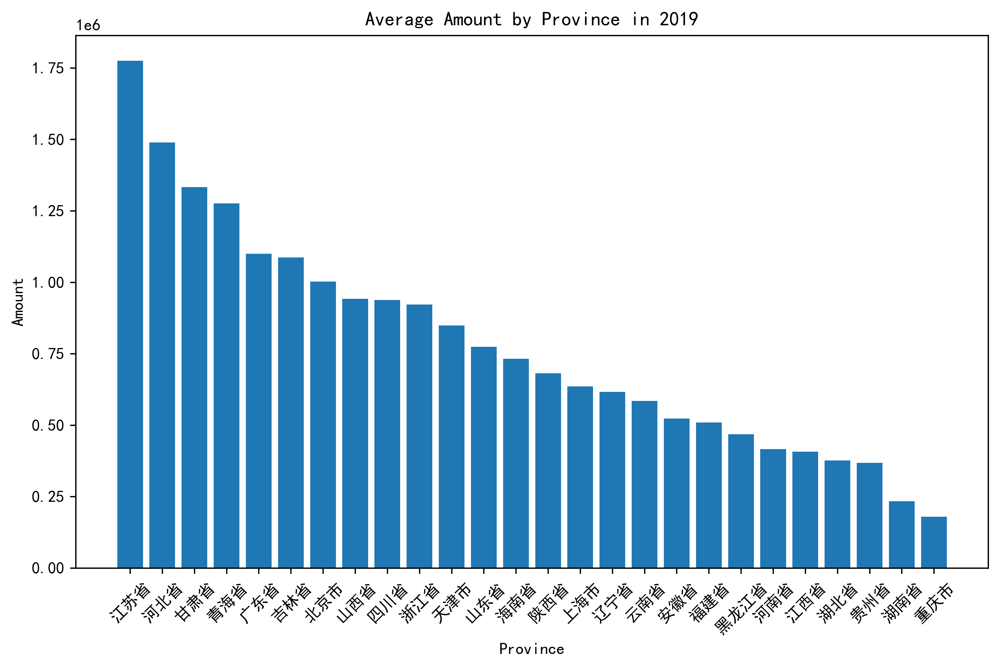

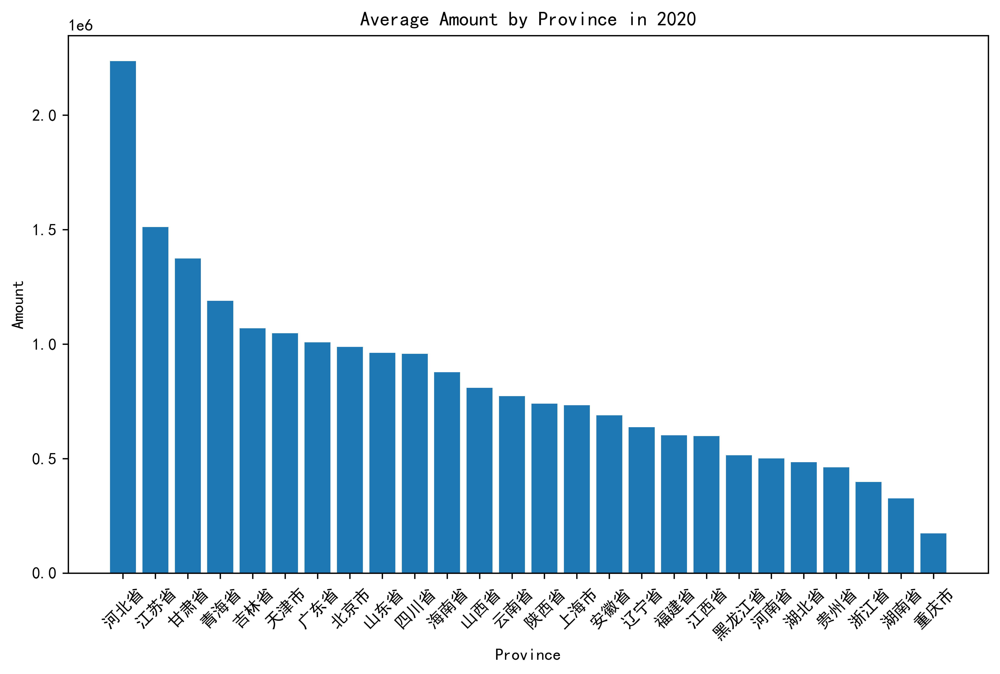

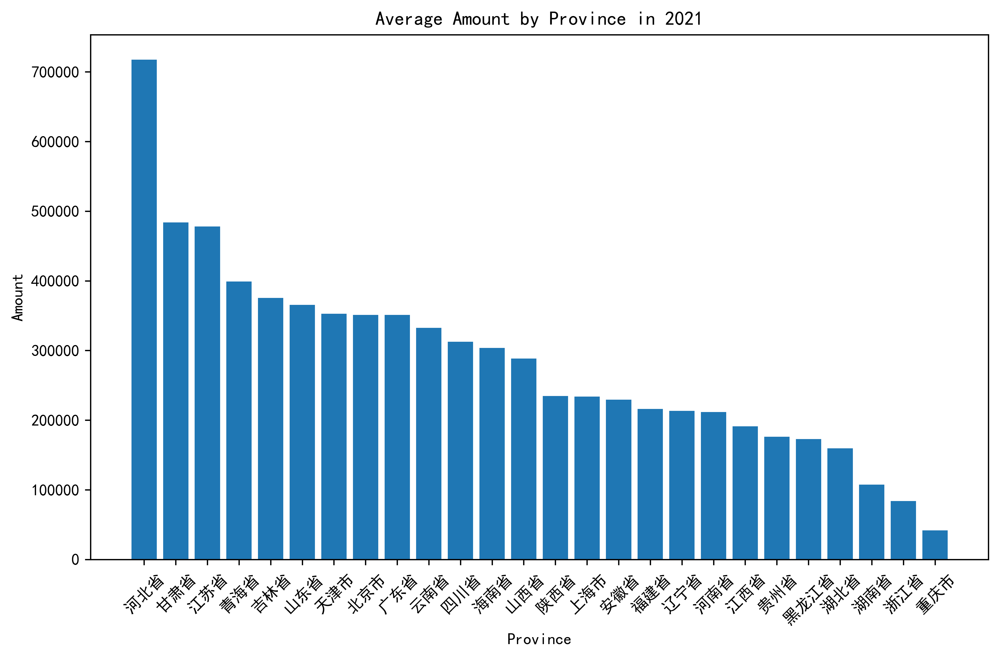

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取清洗后的数据
data = pd.read_csv('preprocessed_data.csv')

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按照年份、省份进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'province'])['amount'].sum().reset_index()

# 比较不同省份之间的金额差异
# 计算每个省份的金额均值
average_amount_by_province = grouped_data.groupby(['year', 'province'])['amount'].mean().reset_index()

# 按照年份和金额进行排序
sorted_data = average_amount_by_province.sort_values(by=['year', 'amount'], ascending=[True, False])

# 绘制条形图
years = sorted_data['year'].unique()
for year in years:
    data_year = sorted_data[sorted_data['year'] == year]
    plt.figure(figsize=(10, 6),dpi = 600)
    plt.bar(data_year['province'], data_year['amount'])
    plt.xlabel('Province')
    plt.ylabel('Amount')
    plt.title('Average Amount by Province in ' + str(year))
    plt.xticks(rotation=45)
    plt.show()


In [24]:
import pandas as pd

# 读取清洗后的数据
data = pd.read_csv('preprocessed_data.csv')

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按照年份、城市进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'city'])['amount'].sum().reset_index()

# 比较不同城市之间的金额差异
# 计算每个城市的金额均值
average_amount_by_city = grouped_data.groupby(['year', 'city'])['amount'].mean().reset_index()

# 按照年份和金额进行排序
sorted_data = average_amount_by_city.sort_values(by=['year', 'amount'], ascending=[True, False])

# 输出结果
print(sorted_data)



     year city      amount
102  2019  西宁市  1004659.78
15   2019  北京市  1002680.92
34   2019  天津市   848822.97
55   2019  承德市   721840.28
1    2019  上海市   635727.30
..    ...  ...         ...
327  2021  昆明市     4531.70
289  2021  合肥市     3679.10
340  2021  洛阳市      608.27
270  2021  东莞市      292.80
333  2021  武威市      179.28

[396 rows x 3 columns]


In [25]:
import pandas as pd

# 读取数据
data = pd.read_csv('preprocessed_data.csv')

# 提取年份信息
data['year'] = pd.to_datetime(data['date']).dt.year

# 按年份和城市进行分组，并计算每个组内的金额总和
grouped_data = data.groupby(['year', 'city'])['amount'].sum().reset_index()

# 计算金额区间
bins = [0, 800000, 1000000, float('inf')]
labels = ['0-800k', '800k-1M', '1M+']
grouped_data['amount_range'] = pd.cut(grouped_data['amount'], bins=bins, labels=labels, right=False)

# 按年份和金额区间统计城市数量
city_counts = grouped_data.groupby(['year', 'amount_range'])['city'].count().reset_index()

# 输出结果
print(city_counts)

# 输出百万以上和八十万到一百万之间的城市
million_plus_cities = grouped_data[grouped_data['amount'] > 1000000]
eighty_thousand_to_million_cities = grouped_data[(grouped_data['amount'] >= 800000) & (grouped_data['amount'] <= 1000000)]
print("Cities with amounts over a million:")
print(million_plus_cities['city'].unique())
print("Cities with amounts between 800k and 1M:")
print(eighty_thousand_to_million_cities['city'].unique())


   year amount_range  city
0  2019       0-800k   128
1  2019      800k-1M     1
2  2019          1M+     2
3  2020       0-800k   131
4  2020      800k-1M     2
5  2020          1M+     2
6  2021       0-800k   130
7  2021      800k-1M     0
8  2021          1M+     0
Cities with amounts over a million:
['北京市' '西宁市' '天津市' '承德市']
Cities with amounts between 800k and 1M:
['天津市' '北京市' '西宁市']
